In [1]:
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import os
import pandas as pd

/ihome/djishnu/alw399/.local/lib/python3.9/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


### Segment

In [3]:
import bin2cell as b2c

#create directory for stardist input/output files
os.makedirs("stardist", exist_ok=True)

In [4]:
basedir = '/ix3/djishnu/alw399/SpaceOracle/data/visiumHD_kidney'

path = f"{basedir}/square_002um"
source_image_path = f"/ix3/djishnu/alw399/SpaceOracle/data/visiumHD_kidney/Visium_HD_Mouse_Kidney_tissue_image.btf"
spaceranger_image_path = f"{basedir}/square_002um/spatial"


In [5]:
adata = b2c.read_visium(path, 
    source_image_path = source_image_path, 
    spaceranger_image_path = spaceranger_image_path
    )
adata.var_names_make_unique()

anndata.py (1820): Variable names are not unique. To make them unique, call `.var_names_make_unique`.
anndata.py (1820): Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [6]:
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.filter_cells(adata, min_counts=1)
adata

AnnData object with n_obs × n_vars = 7943258 × 18856
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'

In [7]:
mpp = 0.3

b2c.scaled_he_image(adata, mpp=mpp, save_path="stardist/he.tiff")

Cropped spatial coordinates key: spatial_cropped_150_buffer
Image key: 0.3_mpp_150_buffer


In [8]:
b2c.destripe(adata)

_construct.py (148): Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


In [9]:
adata.obsm['spatial'][:, 1].min(), adata.obsm['spatial'][:, 1].max()

(2218.963768469836, 26720.42423403248)

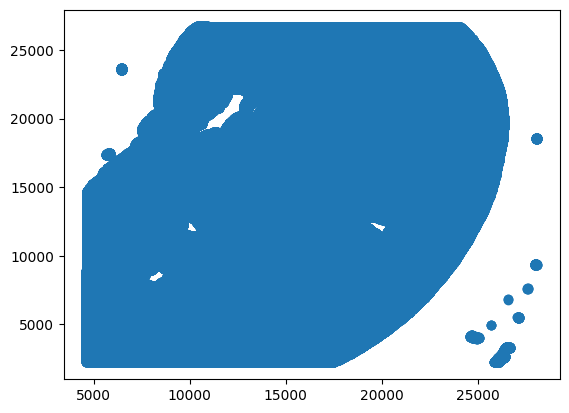

In [10]:
plt.scatter(adata.obsm['spatial'][:, 0], adata.obsm['spatial'][:, 1])

In [11]:
#define a mask to easily pull out this region of the object in the future
mask = ((adata.obs['array_row'] >= 1500) & 
        (adata.obs['array_row'] <= 1600) & 
        (adata.obs['array_col'] >= 1500) & 
        (adata.obs['array_col'] <= 1600)
       )

bdata = adata[mask]
bdata

View of AnnData object with n_obs × n_vars = 10132 × 18856
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'destripe_factor', 'n_counts_adjusted'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_cropped_150_buffer'

anndata.py (1209): Trying to modify attribute `.var` of view, initializing view as actual.
anndata.py (1209): Trying to modify attribute `.var` of view, initializing view as actual.


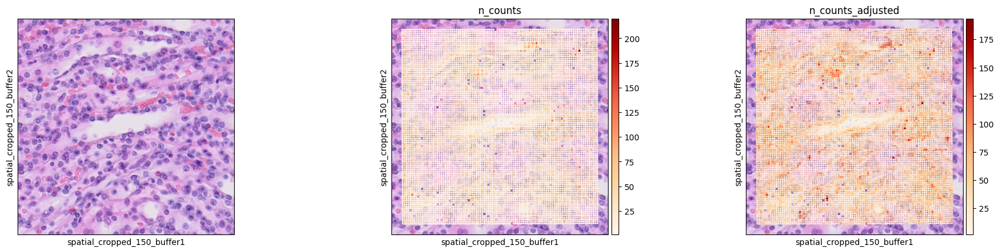

In [12]:
sc.pl.spatial(bdata, color=[None, "n_counts", "n_counts_adjusted"], 
        color_map="OrRd",
        img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer"
)

In [13]:
b2c.stardist(image_path="stardist/he.tiff", 
             labels_npz_path="stardist/he.npz", 
             stardist_model="2D_versatile_he", 
             prob_thresh=0.01
            )

2025-07-02 18:02:37.850135: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-07-02 18:02:38.271928: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /ix3/djishnu/alw399/envs/sheep/lib/python3.9/site-packages/cv2/../../lib64:/ihome/crc/install/gcc-12.2.0/postgresql/15.2/lib:/ihome/crc/install/gcc-12.2.0/imagemagick/6.9.12/lib:/ihome/crc/install/gcc-12.2.0/geos/3.9.4/lib:/ihome/crc/install/gcc-12.2.0/zstd/zstd-1.5.5/lib:/ihome/crc/install/gcc-12.2.0/unixodbc/2.3.11/lib:/ihome/crc/install/

Found model '2D_versatile_he' for 'StarDist2D'.


2025-07-02 18:03:28.183238: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /ix3/djishnu/alw399/envs/sheep/lib/python3.9/site-packages/cv2/../../lib64:/ihome/crc/install/gcc-12.2.0/postgresql/15.2/lib:/ihome/crc/install/gcc-12.2.0/imagemagick/6.9.12/lib:/ihome/crc/install/gcc-12.2.0/geos/3.9.4/lib:/ihome/crc/install/gcc-12.2.0/zstd/zstd-1.5.5/lib:/ihome/crc/install/gcc-12.2.0/unixodbc/2.3.11/lib:/ihome/crc/install/sodium/1.0.18/lib:/ihome/crc/install/gcc-12.2.0/r/4.4.0/lib64/R/lib:/ihome/crc/install/gcc-12.2.0/openmpi/4.1.5/lib:/ihome/crc/install/gcc-12.2.0/fftw/3.3.10/lib:/ihome/crc/install/gcc-12.2.0/glpk/5.0/lib:/ihome/crc/install/gcc-12.2.0/proj/4.9.3/lib:/ihome/crc/install/gcc-12.2.0/gdal/2.4.4/lib:/ihome/crc/install/gcc-12.2.0/netcdf/4.8.1/lib:/ihome/crc/install/gcc-12.2.0/hdf5/1.14.0/lib:/ihome/crc/install/gcc

Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.
effective: block_size=(4096, 4096, 3), min_overlap=(128, 128, 0), context=(128, 128, 0)


100%|██████████| 36/36 [04:45<00:00,  7.93s/it]


Found 355098 objects


In [14]:
b2c.insert_labels(adata, 
    labels_npz_path="stardist/he.npz", 
    basis="spatial", 
    spatial_key="spatial_cropped_150_buffer",
    mpp=mpp, 
    labels_key="labels_he"
    )

4204209659.py (5): Trying to modify attribute `.obs` of view, initializing view as actual.


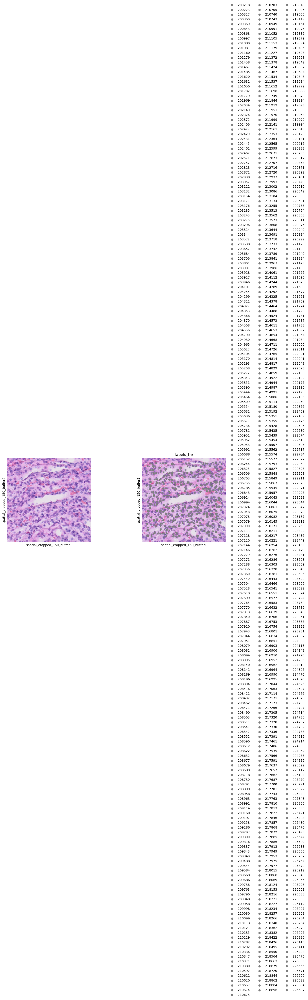

In [15]:
bdata = adata[mask]

#the labels obs are integers, 0 means unassigned
bdata = bdata[bdata.obs['labels_he']>0]
bdata.obs['labels_he'] = bdata.obs['labels_he'].astype(str)

sc.pl.spatial(bdata, color=[None, "labels_he"], img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer")

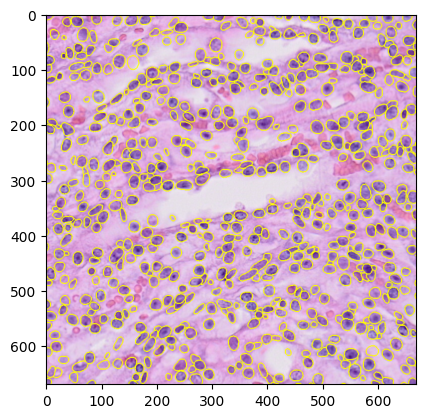

In [16]:
#the label viewer wants a crop of the processed image
#get the corresponding coordinates spanning the subset object
crop = b2c.get_crop(bdata, basis="spatial", spatial_key="spatial_cropped_150_buffer", mpp=mpp)

rendered = b2c.view_labels(image_path="stardist/he.tiff", 
                           labels_npz_path="stardist/he.npz", 
                           crop=crop
                          )
plt.imshow(rendered)

In [17]:
b2c.expand_labels(adata, 
                  labels_key='labels_he', 
                  expanded_labels_key="labels_he_expanded"
                 )

2208659422.py (5): Trying to modify attribute `.obs` of view, initializing view as actual.


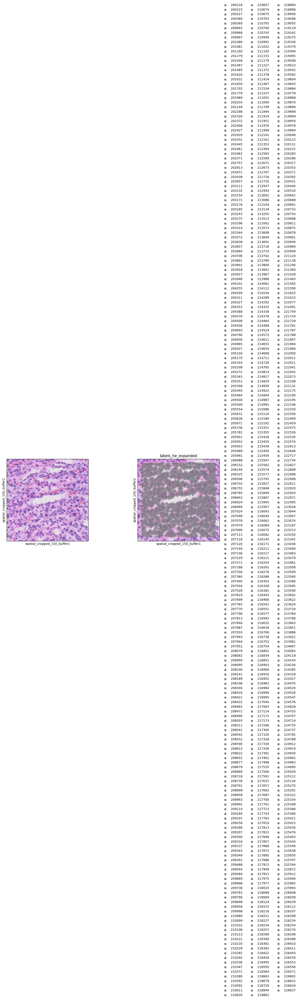

In [18]:
bdata = adata[mask]

#the labels obs are integers, 0 means unassigned
bdata = bdata[bdata.obs['labels_he_expanded']>0]
bdata.obs['labels_he_expanded'] = bdata.obs['labels_he_expanded'].astype(str)

sc.pl.spatial(bdata, color=[None, "labels_he_expanded"], img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer")

In [19]:
b2c.grid_image(adata, "n_counts_adjusted", mpp=mpp, sigma=5, save_path="stardist/gex.tiff")

In [20]:
b2c.stardist(image_path="stardist/gex.tiff", 
             labels_npz_path="stardist/gex.npz", 
             stardist_model="2D_versatile_fluo", 
             prob_thresh=0.05, 
             nms_thresh=0.5
            )

Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.
effective: block_size=(4096, 4096), min_overlap=(128, 128), context=(128, 128)


100%|██████████| 36/36 [13:55<00:00, 23.20s/it]


Found 496475 objects


In [22]:
b2c.insert_labels(adata, 
                  labels_npz_path="stardist/gex.npz", 
                  basis="array", 
                  mpp=mpp, 
                  labels_key="labels_gex"
                 )

3087949908.py (5): Trying to modify attribute `.obs` of view, initializing view as actual.


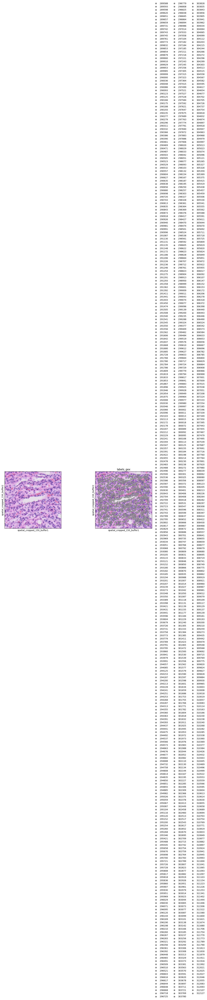

In [23]:
bdata = adata[mask]

#the labels obs are integers, 0 means unassigned
bdata = bdata[bdata.obs['labels_gex']>0]
bdata.obs['labels_gex'] = bdata.obs['labels_gex'].astype(str)

sc.pl.spatial(bdata, color=[None, "labels_gex"], img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer")

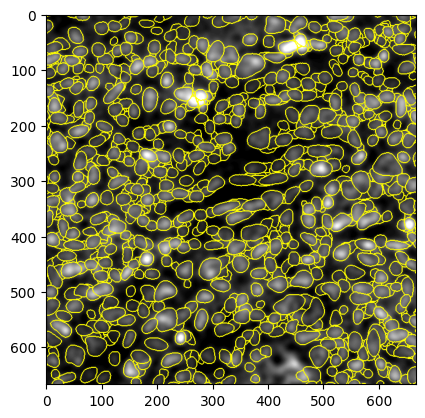

In [25]:
#the label viewer wants a crop of the processed image
#get the corresponding coordinates spanning the subset object
crop = b2c.get_crop(bdata, basis="array", mpp=mpp)

#GEX pops better with percentile normalisation performed
rendered = b2c.view_labels(image_path="stardist/gex.tiff", 
                           labels_npz_path="stardist/gex.npz", 
                           crop=crop,
                           stardist_normalize=True
                          )
plt.imshow(rendered)

In [26]:
b2c.salvage_secondary_labels(adata, 
                             primary_label="labels_he_expanded", 
                             secondary_label="labels_gex", 
                             labels_key="object_id"
                            )

Salvaged 32977 secondary labels


2428170469.py (5): Trying to modify attribute `.obs` of view, initializing view as actual.


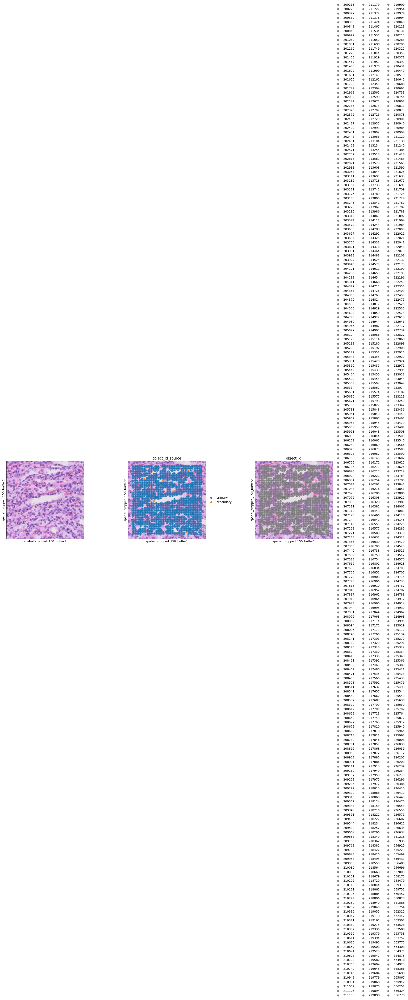

In [27]:
bdata = adata[mask]

#the labels obs are integers, 0 means unassigned
bdata = bdata[bdata.obs['object_id']>0]
bdata.obs['object_id'] = bdata.obs['object_id'].astype(str)

sc.pl.spatial(bdata, color=[None, "object_id_source", "object_id"], 
              img_key="0.3_mpp_150_buffer", basis="spatial_cropped_150_buffer")

In [28]:
cdata = b2c.bin_to_cell(
    adata, 
    labels_key="object_id", 
    spatial_keys=["spatial", "spatial_cropped_150_buffer"])
cdata

AnnData object with n_obs × n_vars = 381430 × 18856
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'object_id_source'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_cropped_150_buffer'

In [29]:
cdata.write_h5ad('stardist/cdata.h5ad')

### Group spots by cells

In [30]:
adata_st = sc.read_h5ad('stardist/cdata.h5ad')
adata_st

AnnData object with n_obs × n_vars = 381430 × 18856
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'object_id_source'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial', 'spatial_cropped_150_buffer'

In [40]:
len(adata_st.obs['object_id'].unique())

348453

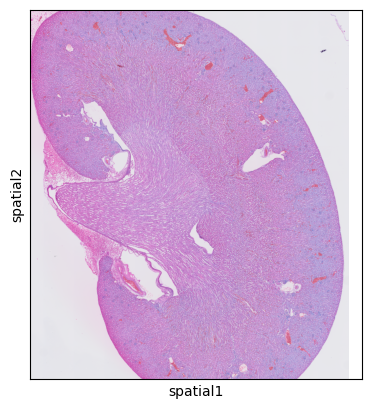

In [41]:
sc.pl.spatial(adata_st, spot_size=10)

In [42]:
coords = adata_st.obsm['spatial']
coords = pd.DataFrame(coords, columns = ['x', 'y'], index=adata_st.obs.index)
coords['object_id'] = adata_st.obs['object_id']

coords = coords.groupby('object_id').mean()
coords.head()

,x,y
object_id,,
1,4676.507826,6360.163113
2,6314.257557,4101.338455
3,8726.773142,5012.906018
4,7288.368271,5437.776591
5,7784.615691,2697.779307


In [43]:
gex_df = adata_st.to_df(layer=None)
adata_st.X.min(), adata_st.X.max()

(0.0, 292.1250121582808)

In [44]:
gex_df['object_id'] = adata_st.obs['object_id']

In [45]:
gex_df.head(3)

,Xkr4,Rp1,Sox17,Lypla1,Tcea1,Rgs20,Atp6v1h,Oprk1,Rb1cc1,St18,...,mt-Atp6,mt-Co3,mt-Nd3,mt-Nd4l,mt-Nd4,mt-Nd5,mt-Nd6,mt-Cytb,Vamp7,object_id
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.046408,0.000000,0.0,0.540231,2.171863,2.251139,0.0,1.046408,0.0,1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,2
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.689415,9.357139,0.0,2.689003,1.999175,2.007633,0.0,0.700087,0.0,3


In [46]:
import gc
del adata_st
gc.collect()

350698

In [ ]:
# run separate.py to avoid running oom

### Run cell2location

In [2]:
import scanpy as sc 
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import cell2location

2025-07-02 21:09:22.789934: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /ihome/crc/install/gcc-12.2.0/postgresql/15.2/lib:/ihome/crc/install/gcc-12.2.0/imagemagick/6.9.12/lib:/ihome/crc/install/gcc-12.2.0/geos/3.9.4/lib:/ihome/crc/install/gcc-12.2.0/zstd/zstd-1.5.5/lib:/ihome/crc/install/gcc-12.2.0/unixodbc/2.3.11/lib:/ihome/crc/install/sodium/1.0.18/lib:/ihome/crc/install/gcc-12.2.0/r/4.4.0/lib64/R/lib:/ihome/crc/install/gcc-12.2.0/openmpi/4.1.5/lib:/ihome/crc/install/gcc-12.2.0/fftw/3.3.10/lib:/ihome/crc/install/gcc-12.2.0/glpk/5.0/lib:/ihome/crc/install/gcc-12.2.0/proj/4.9.3/lib:/ihome/crc/install/gcc-12.2.0/gdal/2.4.4/lib:/ihome/crc/install/gcc-12.2.0/netcdf/4.8.1/lib:/ihome/crc/install/gcc-12.2.0/hdf5/1.14.0/lib:/ihome/crc/install/gcc-12.2.0/jags/4.3.2/lib:/ihome/crc/install/gcc-12.2.0/gsl/2.7.1/lib:/ihome/c

In [3]:
keep_genes = sc.read_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/mouse_kidney_13.h5ad').var_names.tolist()
len(keep_genes)

3058

In [5]:
adata_vis = sc.read_h5ad('mouse_kidney_visiumHD.h5ad')

In [6]:
shared_genes = set(adata_vis.var_names) & set(keep_genes)
shared_genes = list(shared_genes)
len(shared_genes)

2978

In [7]:
# rename
adata_vis = adata_vis[:, shared_genes]
adata_vis.X.min(), adata_vis.X.max()

(array(0.), array(462.94684693))

In [8]:
# bin2cell makes non-int counts
adata_vis.X = np.round(adata_vis.X)

In [9]:
results_folder = './c2l_results/'

# create paths and names to results folders for reference regression and cell2location models
ref_run_name = f'{results_folder}/reference_signatures'
run_name = f'{results_folder}/cell2location_map'

/tmp/ipykernel_59240/1786707662.py:1: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata_vis.var["mt"] = adata_vis.var_names.str.startswith("mt-")
/ix3/djishnu/alw399/envs/sheep/lib/python3.9/site-packages/scanpy/preprocessing/_qc.py:432: RuntimeWarning: invalid value encountered in divide
  return values / sums[:, None]


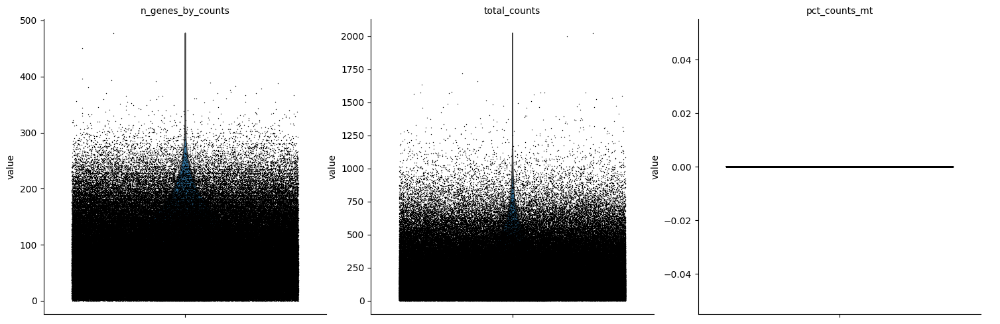

In [10]:
adata_vis.var["mt"] = adata_vis.var_names.str.startswith("mt-")
adata_vis.var["ribo"] = adata_vis.var_names.str.startswith(("Rps", "Rpl"))

sc.pp.calculate_qc_metrics(
    adata_vis, qc_vars=["mt", "ribo"], inplace=True, log1p=True
)
sc.pl.violin(
    adata_vis,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

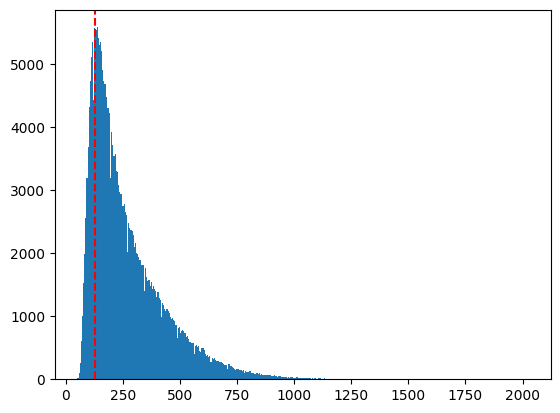

In [16]:
# low thresholds because we already filtered genes since it keeps going oom 

_ = plt.hist(adata_vis.obs['total_counts'], bins=400)
plt.axvline(x=130, color='red', linestyle='--')

In [12]:
sc.pp.filter_cells(adata_vis, min_genes=50)
# sc.pp.filter_genes(adata_vis, min_cells=15) # we're going to use slideseq genes

In [17]:
print(adata_vis.shape)
adata_vis = adata_vis[adata_vis.obs['total_counts'] > 130]
print(adata_vis.shape)

(251473, 2978)
(206989, 2978)


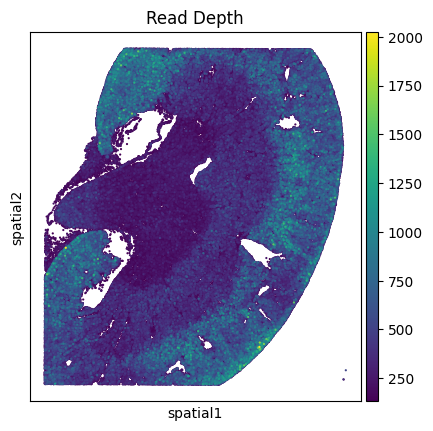

In [18]:
sc.pl.embedding(
    adata_vis,
    basis='spatial',
    color='total_counts',
    size=10,
    title='Read Depth',
    show=False
)
plt.gca().set_aspect('equal')


In [19]:
np.random.seed(42)

In [20]:
batch_size = 10000
pool = set(adata_vis.obs_names)

parta = np.random.choice(list(pool), size=min(len(pool), batch_size), replace=False)
adata_pta = adata_vis[parta].copy()

In [28]:
adata_vis = adata_pta
adata_vis


AnnData object with n_obs × n_vars = 10000 × 2978
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    obsm: 'spatial', 'spatial_unscaled'

In [29]:
adata_ref= sc.read_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/mouse_kidney_13.h5ad')
adata_ref.X = adata_ref.layers['raw_count']

adata_ref.var['SYMBOL'] = adata_ref.var.index
del adata_ref.raw



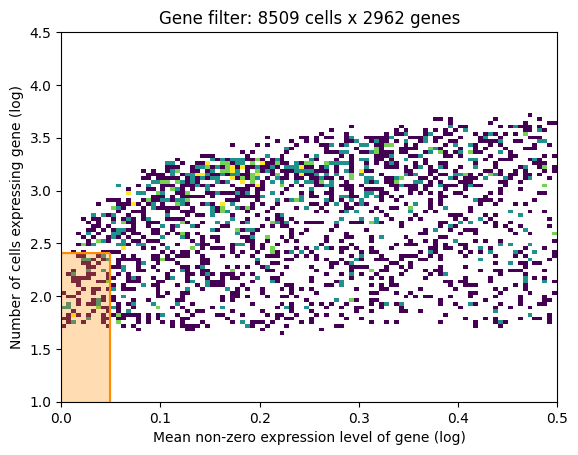

2962


Anndata setup with scvi-tools version 1.1.6.post2.

Setup via `RegressionModel.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': 'Sample',
│   'labels_key': 'Subset',
│   'categorical_covariate_keys': ['Method'],
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   1   │
│         n_cells          │ 8509  │
│ n_extra_categorical_covs │   1   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   7   │
│          n_vars          │ 2962  │
└──────────────────────────┴───────┘

                             Data Registry                             
┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Registry Key      ┃            scvi-tools Location             ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           X            │                  adata.X                   │
│         batch          │          adata.obs['_scvi_batch']          │
│ extra_categorical_covs │ adata.obsm['_scvi_extra_categorical_covs'] │
│         ind_x          │           adata.obs['_indices']            │
│         labels         │         adata.obs['_scvi_labels']          │
└────────────────────────┴────────────────────────────────────────────┘

                   batch State Registry                   
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['Sample'] │  control   │          0          │
└─────────────────────┴────────────┴─────────────────────┘

                       labels State Registry                       
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃     Categories      ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['Subset'] │          B          │          0          │
│                     │     Endothelial     │          1          │
│                     │     Epithelial      │          2          │
│                     │ Mesenchymal_Stromal │          3          │
│                     │       Myeloid       │          4          │
│                     │         NK          │          5          │
│                     │          T          │          6          │
└─────────────────────┴─────────────────────┴─────────────────────┘

          extra_categorical_covs State Registry           
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['Method'] │    GEX     │          0          │
│                     │            │                     │
└─────────────────────┴────────────┴─────────────────────┘

/ihome/djishnu/alw399/.local/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:191: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /ihome/djishnu/alw399/.local/lib/python3.9/site-pack ...
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/ihome/djishnu/alw399/.local/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:191: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /ihome/djishnu/alw399/.local/lib/python3.9/site-pack ...
/ihome/djishnu/alw399/.local/lib/python3.9/site-packages/lightning/pytorch/trainer/configuration_validator.py:72: You passed in a `val_dataloader` but have no

Epoch 250/250: 100%|██████████| 250/250 [00:54<00:00,  6.03it/s, v_num=1, elbo_train=1.26e+7]

`Trainer.fit` stopped: `max_epochs=250` reached.


Epoch 250/250: 100%|██████████| 250/250 [00:54<00:00,  4.57it/s, v_num=1, elbo_train=1.26e+7]


/ihome/djishnu/alw399/.local/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:191: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /ihome/djishnu/alw399/.local/lib/python3.9/site-pack ...


Sampling global variables, sample: 100%|██████████| 999/999 [00:07<00:00, 135.28it/s]


'./c2l_results//reference_signatures/sc.h5ad'

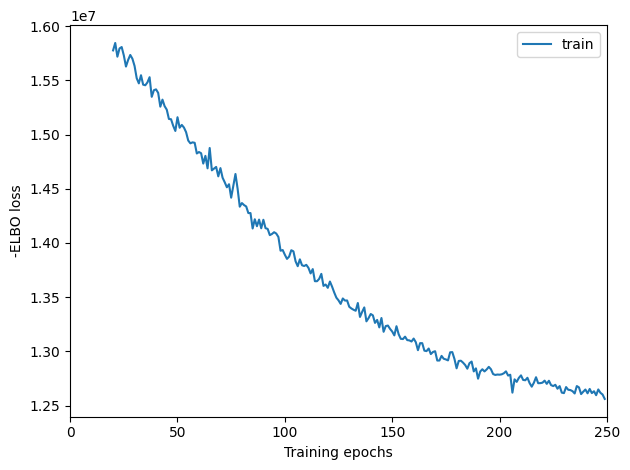

In [30]:

adata_ref.obs['Subset'] = adata_ref.obs['cell_type']
adata_ref.obs['Method'] = 'GEX'
adata_ref.obs['Sample'] = 'control'

adata_vis.X.min(), adata_vis.X.max()

adata_ref.X.min(), adata_ref.X.max()

from cell2location.utils.filtering import filter_genes
selected = filter_genes(adata_ref, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12)
print(len(selected))
# filter the object
adata_ref = adata_ref[:, selected].copy()


# prepare anndata for the regression model
cell2location.models.RegressionModel.setup_anndata(adata=adata_ref,
    # 10X reaction / sample / batch
    batch_key='Sample',
    # cell type, covariate used for constructing signatures
    labels_key='Subset',
    # multiplicative technical effects (platform, 3' vs 5', donor effect)
    categorical_covariate_keys=['Method']
)

# create the regression model
from cell2location.models import RegressionModel
mod = RegressionModel(adata_ref)

# view anndata_setup as a sanity check
mod.view_anndata_setup()

mod.train(max_epochs=250)
mod.plot_history(20)

# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_ref = mod.export_posterior(
    adata_ref, sample_kwargs={'num_samples': 1000, 'batch_size': 2500,
    #  'use_gpu': True
    }
)

# Save model
mod.save(f"{ref_run_name}", overwrite=True)

# Save anndata object with results
adata_file = f"{ref_run_name}/sc.h5ad"
adata_ref.write(adata_file)
adata_file

In [31]:
adata_ref = mod.export_posterior(
    adata_ref, use_quantiles=True,
    # choose quantiles
    # add_to_obsm=["q05","q50", "q95", "q0001"],
    sample_kwargs={'batch_size': 2500,
        # 'use_gpu': True
    }
)


/ihome/djishnu/alw399/.local/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:191: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /ihome/djishnu/alw399/.local/lib/python3.9/site-pack ...


In [32]:

# export estimated expression in each cluster
if 'means_per_cluster_mu_fg' in adata_ref.varm.keys():
    inf_aver = adata_ref.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
else:
    inf_aver = adata_ref.var[[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
inf_aver.columns = adata_ref.uns['mod']['factor_names']
inf_aver.iloc[0:5, 0:5]



,B,Endothelial,Epithelial,Mesenchymal_Stromal,Myeloid
Sox17,0.012539,1.531402,0.238027,6.347325,0.004353
St18,3.482956,0.006679,0.032454,0.198825,0.405930
Prex2,0.079539,5.797565,1.875279,8.513585,0.028173
Lactb2,0.147353,0.216708,1.177339,0.717219,0.159553
Kcnb2,0.000769,0.000548,0.383480,2.238432,0.000214


In [33]:
# find shared genes and subset both anndata and reference signatures
intersect = np.intersect1d(adata_vis.var_names, inf_aver.index)
adata_vis = adata_vis[:, intersect].copy()
inf_aver = inf_aver.loc[intersect, :].copy()

# prepare anndata for cell2location model
cell2location.models.Cell2location.setup_anndata(adata=adata_vis)


Anndata setup with scvi-tools version 1.1.6.post2.

Setup via `Cell2location.setup_anndata` with arguments:

{
│   'layer': None,
│   'batch_key': None,
│   'labels_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   1   │
│         n_cells          │ 10000 │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   1   │
│          n_vars          │ 2895  │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │          adata.X          │
│    batch     │ adata.obs['_scvi_batch']  │
│    ind_x     │   adata.obs['_indices']   │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                     batch State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃     Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_batch'] │     0      │          0          │
└──────────────────────────┴────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

/ihome/djishnu/alw399/.local/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:191: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /ihome/djishnu/alw399/.local/lib/python3.9/site-pack ...
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/ihome/djishnu/alw399/.local/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:191: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /ihome/djishnu/alw399/.local/lib/python3.9/site-pack ...
/ihome/djishnu/alw399/.local/lib/python3.9/site-packages/lightning/pytorch/trainer/configuration_validator.py:72: You passed in a `val_dataloader` but have no

Epoch 18000/18000: 100%|██████████| 18000/18000 [22:49<00:00, 13.29it/s, v_num=1, elbo_train=5.29e+6]

`Trainer.fit` stopped: `max_epochs=18000` reached.


Epoch 18000/18000: 100%|██████████| 18000/18000 [22:49<00:00, 13.14it/s, v_num=1, elbo_train=5.29e+6]


/ihome/djishnu/alw399/.local/lib/python3.9/site-packages/lightning/fabric/plugins/environments/slurm.py:191: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /ihome/djishnu/alw399/.local/lib/python3.9/site-pack ...


Sampling global variables, sample: 100%|██████████| 999/999 [00:17<00:00, 58.64it/s]


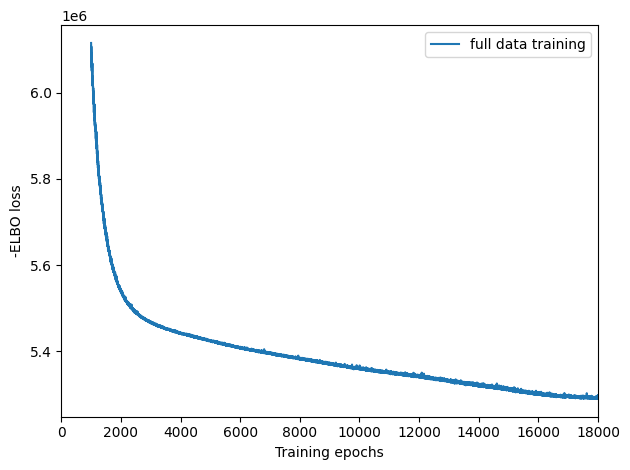

In [34]:
# create and train the model
mod = cell2location.models.Cell2location(
    adata_vis, cell_state_df=inf_aver,
    # the expected average cell abundance: tissue-dependent
    # hyper-prior which can be estimated from paired histology:
    N_cells_per_location=1,
    # hyperparameter controlling normalisation of
    # within-experiment variation in RNA detection:
    detection_alpha=20
)
mod.view_anndata_setup()

mod.train(max_epochs=18000,
        # train using full data (batch_size=None)
        batch_size=None,
        # use all data points in training because
        # we need to estimate cell abundance at all locations
        train_size=1,
        #   use_gpu=True,
        )

# plot ELBO loss history during training, removing first 100 epochs from the plot
mod.plot_history(1000)
plt.legend(labels=['full data training']);

# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_vis = mod.export_posterior(
    adata_vis, sample_kwargs={'num_samples': 1000, 'batch_size': mod.adata.n_obs, 
    # 'use_gpu': True
    }
)

# Save model
mod.save(f"{run_name}", overwrite=True)

# mod = cell2location.models.Cell2location.load(f"{run_name}", adata_vis)

# add 5% quantile, representing confident cell abundance, 'at least this amount is present',
# to adata.obs with nice names for plotting
adata_vis.obs[adata_vis.uns['mod']['factor_names']] = adata_vis.obsm['q05_cell_abundance_w_sf']

# Save anndata object with results
adata_file = f"{run_name}/sp_c2l.h5ad"
adata_vis.write(adata_file)

In [35]:
adata_vis

AnnData object with n_obs × n_vars = 10000 × 2895
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', '_indices', '_scvi_batch', '_scvi_labels', 'B', 'Endothelial', 'Epithelial', 'Mesenchymal_Stromal', 'Myeloid', 'NK', 'T'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: '_scvi_uuid', '_scvi_manager_uuid', 'mod'
    obsm: 'spatial', 'spatial_unscaled', 'means_cell_abundance_w_sf', 'stds_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf'

### Probs to cell type

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

/ihome/djishnu/alw399/.local/lib/python3.9/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


In [2]:
adata_vis = sc.read_h5ad('/ix3/djishnu/alw399/SpaceOracle/notebooks/mouse_kidney_transfer/c2l_results/cell2location_map/sp_c2l.h5ad')
adata_vis

AnnData object with n_obs × n_vars = 10000 × 2895
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', '_indices', '_scvi_batch', '_scvi_labels', 'B', 'Endothelial', 'Epithelial', 'Mesenchymal_Stromal', 'Myeloid', 'NK', 'T'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'spatial_unscaled', 'stds_cell_abundance_w_sf'

In [4]:
props = adata_vis.obs[['B', 'Endothelial', 'Epithelial', 'Mesenchymal_Stromal', 'Myeloid', 'NK', 'T']]
props

,B,Endothelial,Epithelial,Mesenchymal_Stromal,Myeloid,NK,T
object_id,,,,,,,
35131,0.022530,0.007511,0.524545,0.002058,0.030323,0.011528,0.011702
261116,0.001150,0.006250,0.002408,0.064635,0.001718,0.001961,0.002753
840279,0.033658,0.019258,0.331639,0.098951,0.029612,0.049306,0.040392
37309,0.009121,0.005604,0.041214,0.002782,0.065841,0.026819,0.021185
4693,0.050317,0.014173,0.467922,0.006058,0.025501,0.019762,0.022036
...,...,...,...,...,...,...,...
315054,0.013627,0.002775,0.025685,0.013869,0.005034,0.011482,0.005077
301595,0.015980,0.003994,0.528140,0.000852,0.005953,0.009188,0.009871
313083,0.004706,0.059248,0.016481,0.001350,0.002109,0.009927,0.009837


In [6]:
adata_vis.obs['cell_type'] = props.idxmax(axis=1)
adata_vis.obs['cell_type'].value_counts()



cell_type
Epithelial             5437
Mesenchymal_Stromal    1723
Endothelial            1369
Myeloid                 537
T                       381
NK                      327
B                       226
Name: count, dtype: int64

In [12]:
adata_vis.write_h5ad('mouse_kidney_visiumHD_c2l.h5ad')

AnnData object with n_obs × n_vars = 10000 × 2895
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', '_indices', '_scvi_batch', '_scvi_labels', 'B', 'Endothelial', 'Epithelial', 'Mesenchymal_Stromal', 'Myeloid', 'NK', 'T', 'cell_type'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'mod', 'cell_type_colors'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'spatial_unscaled', 'stds_cell_abundance_w_sf'

In [ ]:
for k in ['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', '_indices', '_scvi_batch', '_scvi_labels', 'B', 'Endothelial', 'Epithelial', 'Mesenchymal_Stromal', 'Myeloid', 'NK', 'T']:
    del adata_vis.obs[k]

for k in ['mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts']:
    del adata_vis.var[k]

del adata_vis.uns

for k in ['means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'stds_cell_abundance_w_sf']:
    del adata_vis.obsm[k]


In [25]:
adata_vis.X.min(), adata_vis.X.max()

(0.0, 348.0)

In [21]:
keep_genes = sc.read_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/mouse_kidney_13.h5ad').var_names.tolist()
len(keep_genes)

3058

In [26]:
adata_vis = sc.AnnData(
    adata_vis.to_df().reindex(columns=keep_genes).fillna(0).values,
    obs=adata_vis.obs, 
    var=pd.DataFrame(index=keep_genes),
    obsm={'spatial': adata_vis.obsm['spatial_unscaled']},
)

adata_vis

AnnData object with n_obs × n_vars = 10000 × 3058
    obs: 'cell_type'
    obsm: 'spatial'

In [27]:
adata_vis.layers['raw_count'] = adata_vis.X.copy()

In [28]:
sc.pp.log1p(adata_vis)
adata_vis.layers['normalized_count'] = adata_vis.X.copy()

In [29]:
import sys
sys.path.append('../../src')
from spaceoracle.tools.utils import scale_adata

adata_vis= scale_adata(adata_vis, cell_size=10)
adata_vis

2025-07-02 22:18:28.262505: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /ihome/crc/install/gcc-12.2.0/postgresql/15.2/lib:/ihome/crc/install/gcc-12.2.0/imagemagick/6.9.12/lib:/ihome/crc/install/gcc-12.2.0/geos/3.9.4/lib:/ihome/crc/install/gcc-12.2.0/zstd/zstd-1.5.5/lib:/ihome/crc/install/gcc-12.2.0/unixodbc/2.3.11/lib:/ihome/crc/install/sodium/1.0.18/lib:/ihome/crc/install/gcc-12.2.0/r/4.4.0/lib64/R/lib:/ihome/crc/install/gcc-12.2.0/openmpi/4.1.5/lib:/ihome/crc/install/gcc-12.2.0/fftw/3.3.10/lib:/ihome/crc/install/gcc-12.2.0/glpk/5.0/lib:/ihome/crc/install/gcc-12.2.0/proj/4.9.3/lib:/ihome/crc/install/gcc-12.2.0/gdal/2.4.4/lib:/ihome/crc/install/gcc-12.2.0/netcdf/4.8.1/lib:/ihome/crc/install/gcc-12.2.0/hdf5/1.14.0/lib:/ihome/crc/install/gcc-12.2.0/jags/4.3.2/lib:/ihome/crc/install/gcc-12.2.0/gsl/2.7.1/lib:/ihome/c

AnnData object with n_obs × n_vars = 10000 × 3058
    obs: 'cell_type'
    uns: 'log1p'
    obsm: 'spatial', 'spatial_unscaled'
    layers: 'raw_count', 'normalized_count'

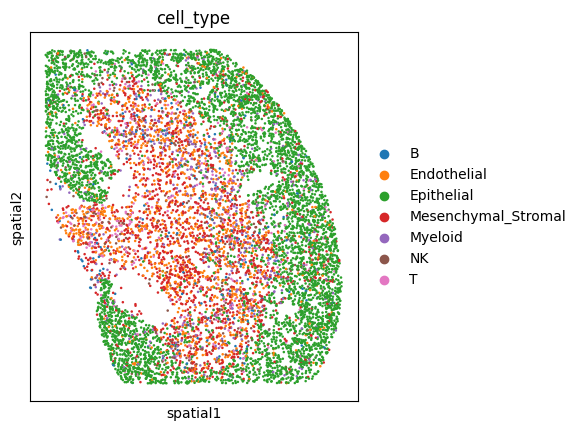

In [31]:
sc.pl.spatial(adata_vis, color=['cell_type'], spot_size=20)

In [32]:
adata_vis.write_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/mouse_kidney_visiumHD.h5ad')